In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import ImageDraw
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
import re,os, json, PIL, shutil, re, imageio, glob

from kaggle_datasets import KaggleDatasets
import matplotlib.pyplot as plt

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

2022-12-17 20:56:33.895565: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/conda/lib
2022-12-17 20:56:33.895663: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Device: grpc://10.0.0.2:8470


2022-12-17 20:56:38.730421: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-12-17 20:56:38.733575: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/conda/lib
2022-12-17 20:56:38.733595: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2022-12-17 20:56:38.733616: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (2bccbdaa41d2): /proc/driver/nvidia/version does not exist
2022-12-17 20:56:38.736309: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operation

Number of replicas: 8
2.4.1


In [2]:
# Load data
GCS_PATH = KaggleDatasets().get_gcs_path()
MONET_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/monet_tfrec/*.tfrec'))
PHOTO_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/photo_tfrec/*.tfrec'))

print('Monet TFRecord Files:', len(MONET_FILENAMES))
print('Photo TFRecord Files:', len(PHOTO_FILENAMES))

def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)
n_monet_samples = count_data_items(MONET_FILENAMES)
n_photo_samples = count_data_items(PHOTO_FILENAMES)

print(f'Monet image files: {n_monet_samples}')
print(f'Photo image files: {n_photo_samples}')

Monet TFRecord Files: 5
Photo TFRecord Files: 20
Monet image files: 300
Photo image files: 7038


2022-12-17 20:56:45.257070: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2022-12-17 20:56:45.320155: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.


In [3]:
IMAGE_SIZE = [256, 256]
CHANNELS = 3
AUTO = tf.data.experimental.AUTOTUNE

def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    return (img / 127.5) - 1.0

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=CHANNELS)
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        'image':      tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTO)
    return dataset

def get_dataset(filenames, augment=None, repeat=True, shuffle=True, batch_size=1):
    dataset = load_dataset(filenames)

    if augment:
        dataset = dataset.map(augment, num_parallel_calls=AUTO)
    dataset = dataset.map(normalize_img, num_parallel_calls=AUTO)
    if repeat:
        dataset = dataset.repeat()
    if shuffle:
        dataset = dataset.shuffle(512)
        
    dataset = dataset.batch(batch_size)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTO)
    
    return dataset

In [4]:
def data_augment(image):
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    if p_rotate > .8:
        image = tf.image.rot90(image, k=3) 
    elif p_rotate > .6:
        image = tf.image.rot90(image, k=2)
    elif p_rotate > .4:
        image = tf.image.rot90(image, k=1) 
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    if p_spatial > .75:
        image = tf.image.transpose(image)
    image = tf.image.random_crop(image, size=[256, 256, CHANNELS])
        
    
    return image

In [5]:
BATCH_SIZE = 16
monet_ds = get_dataset(MONET_FILENAMES, augment=data_augment, batch_size=BATCH_SIZE)
photo_ds = get_dataset(PHOTO_FILENAMES, augment=data_augment, batch_size=BATCH_SIZE)

In [6]:
def display_samples(monet_ds, photo_ds, n_samples):
    monet_ds_iter = iter(monet_ds)
    photo_ds_iter = iter(photo_ds)
    for n_sample in range(n_samples):
        f = plt.figure(figsize=(12, 12))
        monet_sample = next(monet_ds_iter)
        photo_sample = next(photo_ds_iter)
        plt.subplot(121)
        plt.title('Monet example')
        plt.imshow(monet_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        
        plt.subplot(122)
        plt.title('Photo example')
        plt.imshow(photo_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.show()

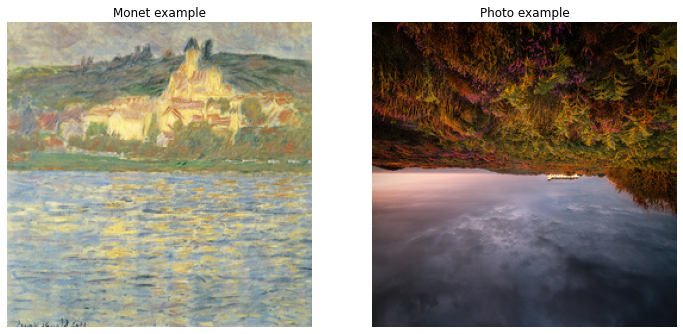

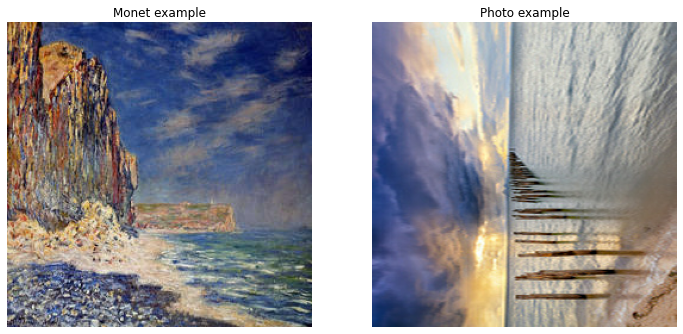

In [7]:
display_samples(monet_ds, photo_ds, 2)

In [8]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma))
    result.add(layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))
    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))
    if apply_dropout:
        result.add(layers.Dropout(0.5))
    result.add(layers.ReLU())
    return result

In [9]:
def Generator():
    inputs = layers.Input(shape=[256,256,3])
    down_stack = [
        downsample(64, 4, apply_instancenorm=False),
        downsample(128, 4), 
        downsample(256, 4),
        downsample(512, 4), 
        downsample(512, 4), 
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), 
        upsample(512, 4),
        upsample(256, 4), 
        upsample(128, 4), 
        upsample(64, 4), 
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh')
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])
    x = last(x)
    return keras.Model(inputs=inputs, outputs=x)

In [10]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)
    zero_pad1 = layers.ZeroPadding2D()(down3)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) 
    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)
    leaky_relu = layers.LeakyReLU()(norm1)
    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) 
    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) 
    return tf.keras.Model(inputs=inp, outputs=last)

In [11]:
with strategy.scope():
    monet_generator = Generator() 
    photo_generator = Generator() 
    monet_discriminator = Discriminator() 
    photo_discriminator = Discriminator() 

In [12]:
def display_generated_samples(ds, model, n_samples):
    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        example_sample = next(ds_iter)
        generated_sample = model.predict(example_sample)
        
        f = plt.figure(figsize=(12, 12))
        
        plt.subplot(121)
        plt.title('Input image')
        plt.imshow(example_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        
        plt.subplot(122)
        plt.title('Generated image')
        plt.imshow(generated_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.show()

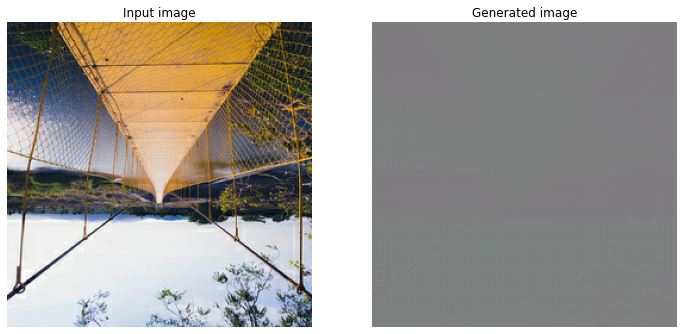

In [13]:
display_generated_samples(photo_ds, monet_generator, 1)

In [14]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)
        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))
        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))
        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))
        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [15]:
# Loss
with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)
        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
        total_disc_loss = real_loss + generated_loss
        return total_disc_loss * 0.5

    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
        return LAMBDA * loss1
    
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

30 total epochs and 439 steps per epoch
Learning rate schedule: 2e-05 to 2e-05 to 1.52e-07


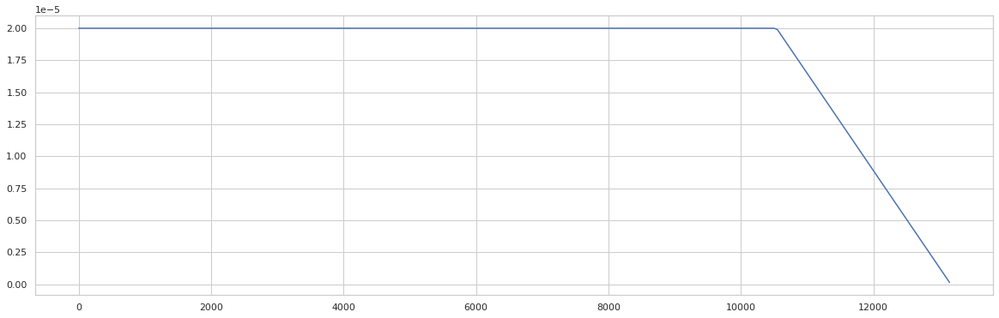

In [16]:
n_monet_samples = count_data_items(MONET_FILENAMES)
n_photo_samples = count_data_items(PHOTO_FILENAMES)
BATCH_SIZE = 16
EPOCHS = 30

@tf.function
def linear_schedule_with_warmup(step):
    lr_start   = 2e-5
    lr_max     = 2e-5
    lr_min     = 0.
    
    steps_per_epoch = int(max(n_monet_samples, n_photo_samples)//BATCH_SIZE)
    total_steps = EPOCHS * steps_per_epoch
    warmup_steps = 1
    hold_max_steps = total_steps * 0.8
    
    if step < warmup_steps:
        lr = (lr_max - lr_start) / warmup_steps * step + lr_start
    elif step < warmup_steps + hold_max_steps:
        lr = lr_max
    else:
        lr = lr_max * ((total_steps - step) / (total_steps - warmup_steps - hold_max_steps))
        if lr_min is not None:
            lr = tf.math.maximum(lr_min, lr)

    return lr

steps_per_epoch = int(max(n_monet_samples, n_photo_samples)//BATCH_SIZE)
total_steps = EPOCHS * steps_per_epoch
rng = [i for i in range(0, total_steps, 50)]
y = [linear_schedule_with_warmup(x) for x in rng]

sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(20, 6))
plt.plot(rng, y)
print(f'{EPOCHS} total epochs and {steps_per_epoch} steps per epoch')
print(f'Learning rate schedule: {y[0]:.3g} to {max(y):.3g} to {y[-1]:.3g}')

In [17]:
with strategy.scope():
    # generators
    lr_monet_gen = lambda: linear_schedule_with_warmup(tf.cast(monet_generator_optimizer.iterations, tf.float32))
    lr_photo_gen = lambda: linear_schedule_with_warmup(tf.cast(photo_generator_optimizer.iterations, tf.float32))
    
    monet_generator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_monet_gen, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_photo_gen, beta_1=0.5)

    # discriminators
    lr_monet_disc = lambda: linear_schedule_with_warmup(tf.cast(monet_discriminator_optimizer.iterations, tf.float32))
    lr_photo_disc = lambda: linear_schedule_with_warmup(tf.cast(photo_discriminator_optimizer.iterations, tf.float32))
    
    monet_discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_monet_disc, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr_photo_disc, beta_1=0.5)

In [18]:
# Create GAN
with strategy.scope():
    gan_model = CycleGan(monet_generator, photo_generator, 
                         monet_discriminator, photo_discriminator)

    gan_model.compile(m_gen_optimizer=monet_generator_optimizer,
                      p_gen_optimizer=photo_generator_optimizer,
                      m_disc_optimizer=monet_discriminator_optimizer,
                      p_disc_optimizer=photo_discriminator_optimizer,
                      gen_loss_fn=generator_loss,
                      disc_loss_fn=discriminator_loss,
                      cycle_loss_fn=calc_cycle_loss,
                      identity_loss_fn=identity_loss)

In [19]:
photo_ds_eval = get_dataset(PHOTO_FILENAMES, repeat=False, shuffle=False, batch_size=1)
monet_ds_eval = get_dataset(MONET_FILENAMES, repeat=False, shuffle=False, batch_size=1)

class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, num_img=1, monet_path='monet', photo_path='photo'):
        self.num_img = num_img
        self.monet_path = monet_path
        self.photo_path = photo_path
        if not os.path.exists(self.monet_path):
            os.makedirs(self.monet_path)
        if not os.path.exists(self.photo_path):
            os.makedirs(self.photo_path)

    def on_epoch_end(self, epoch, logs=None):
        for i, img in enumerate(photo_ds_eval.take(self.num_img)):
            prediction = monet_generator(img, training=False)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            prediction = PIL.Image.fromarray(prediction)
            prediction.save(f'{self.monet_path}/generated_{i}_{epoch+1}.png')
            
        for i, img in enumerate(monet_ds_eval.take(self.num_img)):
            prediction = photo_generator(img, training=False)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            prediction = PIL.Image.fromarray(prediction)
            prediction.save(f'{self.photo_path}/generated_{i}_{epoch+1}.png')

In [20]:
gan_ds = tf.data.Dataset.zip((monet_ds, photo_ds))

In [21]:
history = gan_model.fit(gan_ds, 
                        epochs=EPOCHS, 
                        callbacks=[GANMonitor()], 
                        steps_per_epoch=(max(n_monet_samples, n_photo_samples)//BATCH_SIZE)).history

Epoch 1/30
439/439 [==============================] - 123s 130ms/step - monet_gen_loss: 8.3208 - photo_gen_loss: 8.6108 - monet_disc_loss: 0.6370 - photo_disc_loss: 0.6337


2022-12-17 20:59:11.124643: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 12941, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671310751.121042047","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 12941, Output num: 0","grpc_status":3}


Epoch 2/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 4.8370 - photo_gen_loss: 4.9457 - monet_disc_loss: 0.5724 - photo_disc_loss: 0.5503
Epoch 3/30
439/439 [==============================] - 57s 129ms/step - monet_gen_loss: 4.4601 - photo_gen_loss: 4.6212 - monet_disc_loss: 0.5414 - photo_disc_loss: 0.4626


2022-12-17 21:01:05.702909: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 22535, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671310865.702825722","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 22535, Output num: 0","grpc_status":3}


Epoch 4/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 4.4485 - photo_gen_loss: 4.6419 - monet_disc_loss: 0.4508 - photo_disc_loss: 0.3815
Epoch 5/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 4.3500 - photo_gen_loss: 4.4818 - monet_disc_loss: 0.4846 - photo_disc_loss: 0.4139


2022-12-17 21:03:00.583675: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 32129, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671310980.583607163","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 32129, Output num: 0","grpc_status":3}


Epoch 6/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 4.1879 - photo_gen_loss: 4.3523 - monet_disc_loss: 0.5129 - photo_disc_loss: 0.4282
Epoch 7/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 4.0938 - photo_gen_loss: 4.1711 - monet_disc_loss: 0.5229 - photo_disc_loss: 0.4610


2022-12-17 21:04:55.572134: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 41723, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671311095.572091084","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 41723, Output num: 0","grpc_status":3}


Epoch 8/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 3.9538 - photo_gen_loss: 4.0775 - monet_disc_loss: 0.5546 - photo_disc_loss: 0.4601
Epoch 9/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 3.8426 - photo_gen_loss: 3.9962 - monet_disc_loss: 0.5711 - photo_disc_loss: 0.4912


2022-12-17 21:06:50.676968: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 51317, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671311210.676831420","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 51317, Output num: 0","grpc_status":3}


Epoch 10/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 3.6932 - photo_gen_loss: 3.8874 - monet_disc_loss: 0.5953 - photo_disc_loss: 0.5115
Epoch 11/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 3.5935 - photo_gen_loss: 3.7660 - monet_disc_loss: 0.6087 - photo_disc_loss: 0.5416


2022-12-17 21:08:45.911011: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 60911, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671311325.910936084","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 60911, Output num: 0","grpc_status":3}


Epoch 12/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 3.4623 - photo_gen_loss: 3.6629 - monet_disc_loss: 0.6162 - photo_disc_loss: 0.5447
Epoch 13/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 3.3769 - photo_gen_loss: 3.5536 - monet_disc_loss: 0.6226 - photo_disc_loss: 0.5623


2022-12-17 21:10:40.994542: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 70505, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671311440.994443240","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 70505, Output num: 0","grpc_status":3}


Epoch 14/30
439/439 [==============================] - 58s 131ms/step - monet_gen_loss: 3.3227 - photo_gen_loss: 3.4834 - monet_disc_loss: 0.6147 - photo_disc_loss: 0.5631
Epoch 15/30
439/439 [==============================] - 57s 131ms/step - monet_gen_loss: 3.2622 - photo_gen_loss: 3.4000 - monet_disc_loss: 0.6238 - photo_disc_loss: 0.5905


2022-12-17 21:12:36.957648: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 80099, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671311556.957487621","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 80099, Output num: 0","grpc_status":3}


Epoch 16/30
439/439 [==============================] - 57s 131ms/step - monet_gen_loss: 3.2196 - photo_gen_loss: 3.3641 - monet_disc_loss: 0.6268 - photo_disc_loss: 0.6037
Epoch 17/30
439/439 [==============================] - 57s 131ms/step - monet_gen_loss: 3.1838 - photo_gen_loss: 3.3458 - monet_disc_loss: 0.6225 - photo_disc_loss: 0.5998


2022-12-17 21:14:32.835812: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 89693, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671311672.835724103","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 89693, Output num: 0","grpc_status":3}


Epoch 18/30
439/439 [==============================] - 58s 132ms/step - monet_gen_loss: 3.1628 - photo_gen_loss: 3.2922 - monet_disc_loss: 0.6260 - photo_disc_loss: 0.6059
Epoch 19/30
439/439 [==============================] - 57s 131ms/step - monet_gen_loss: 3.1545 - photo_gen_loss: 3.2388 - monet_disc_loss: 0.6308 - photo_disc_loss: 0.6142


2022-12-17 21:16:28.919672: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 99287, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671311788.919581078","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 99287, Output num: 0","grpc_status":3}


Epoch 20/30
439/439 [==============================] - 57s 131ms/step - monet_gen_loss: 3.1115 - photo_gen_loss: 3.2309 - monet_disc_loss: 0.6216 - photo_disc_loss: 0.6135
Epoch 21/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 3.0614 - photo_gen_loss: 3.1794 - monet_disc_loss: 0.6217 - photo_disc_loss: 0.5988


2022-12-17 21:18:24.473949: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 108881, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671311904.473903853","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 108881, Output num: 0","grpc_status":3}


Epoch 22/30
439/439 [==============================] - 57s 131ms/step - monet_gen_loss: 3.0428 - photo_gen_loss: 3.1708 - monet_disc_loss: 0.6292 - photo_disc_loss: 0.6122
Epoch 23/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 2.9752 - photo_gen_loss: 3.1206 - monet_disc_loss: 0.6284 - photo_disc_loss: 0.6068


2022-12-17 21:20:19.842645: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 118475, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671312019.842586456","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 118475, Output num: 0","grpc_status":3}


Epoch 24/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 2.9622 - photo_gen_loss: 3.0795 - monet_disc_loss: 0.6371 - photo_disc_loss: 0.6140
Epoch 25/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 2.8998 - photo_gen_loss: 3.0383 - monet_disc_loss: 0.6305 - photo_disc_loss: 0.6089


2022-12-17 21:22:14.975006: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 128069, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671312134.974920640","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 128069, Output num: 0","grpc_status":3}


Epoch 26/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 2.8955 - photo_gen_loss: 3.0683 - monet_disc_loss: 0.6392 - photo_disc_loss: 0.6115
Epoch 27/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 2.8847 - photo_gen_loss: 3.0376 - monet_disc_loss: 0.6204 - photo_disc_loss: 0.5984


2022-12-17 21:24:10.194310: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 137663, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671312250.194112087","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 137663, Output num: 0","grpc_status":3}


Epoch 28/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 2.8321 - photo_gen_loss: 2.9651 - monet_disc_loss: 0.6244 - photo_disc_loss: 0.6050
Epoch 29/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 2.8335 - photo_gen_loss: 2.9860 - monet_disc_loss: 0.6212 - photo_disc_loss: 0.6020


2022-12-17 21:26:05.487652: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 147257, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1671312365.487538687","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 147257, Output num: 0","grpc_status":3}


Epoch 30/30
439/439 [==============================] - 57s 130ms/step - monet_gen_loss: 2.8051 - photo_gen_loss: 2.9617 - monet_disc_loss: 0.6308 - photo_disc_loss: 0.6154


In [22]:
def create_gif(images_path, gif_path):
    images = []
    filenames = glob.glob(images_path)
    filenames.sort(key=lambda x: int(''.join(filter(str.isdigit, x))))
    for epoch, filename in enumerate(filenames):
        img = PIL.ImageDraw.Image.open(filename)
        ImageDraw.Draw(img).text((0, 0),  # Coordinates
                                 f'Epoch {epoch+1}')
        images.append(img)
    imageio.mimsave(gif_path, images, fps=2) # Save gif

In [23]:
create_gif('/kaggle/working/monet/*.png', 'monet.gif')

<img src='monet.gif' width=350>

In [24]:
create_gif('/kaggle/working/photo/*.png', 'photo.gif') # Create photo gif

<img src='photo.gif' width=350>

In [25]:
def evaluate_cycle(ds, generator_a, generator_b, n_samples=1):
    fig, axes = plt.subplots(n_samples, 3, figsize=(22, (n_samples*6)))
    axes = axes.flatten()
    
    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        idx = n_sample*3
        example_sample = next(ds_iter)
        generated_a_sample = generator_a.predict(example_sample)
        generated_b_sample = generator_b.predict(generated_a_sample)
        
        axes[idx].set_title('Input image', fontsize=18)
        axes[idx].imshow(example_sample[0] * 0.5 + 0.5)
        axes[idx].axis('off')
        
        axes[idx+1].set_title('Generated image', fontsize=18)
        axes[idx+1].imshow(generated_a_sample[0] * 0.5 + 0.5)
        axes[idx+1].axis('off')
        
        axes[idx+2].set_title('Cycled image', fontsize=18)
        axes[idx+2].imshow(generated_b_sample[0] * 0.5 + 0.5)
        axes[idx+2].axis('off')
        
    plt.show()

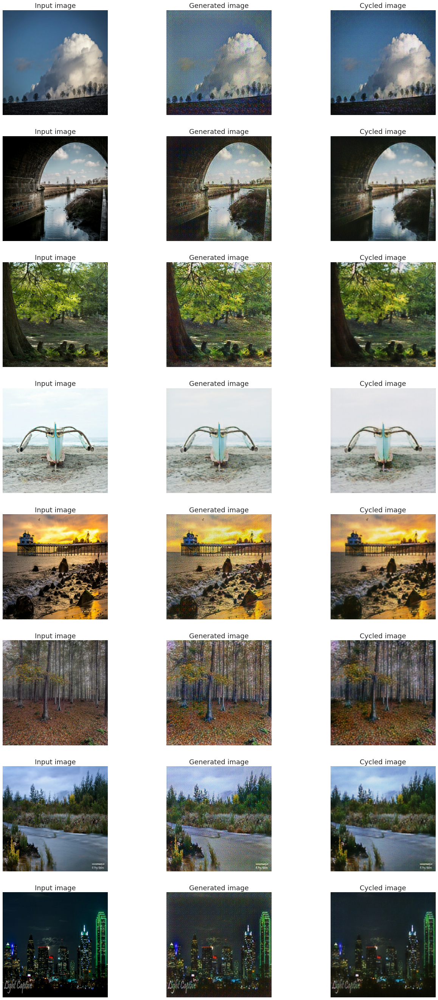

In [30]:
evaluate_cycle(photo_ds_eval.take(8), monet_generator, photo_generator, n_samples=8)

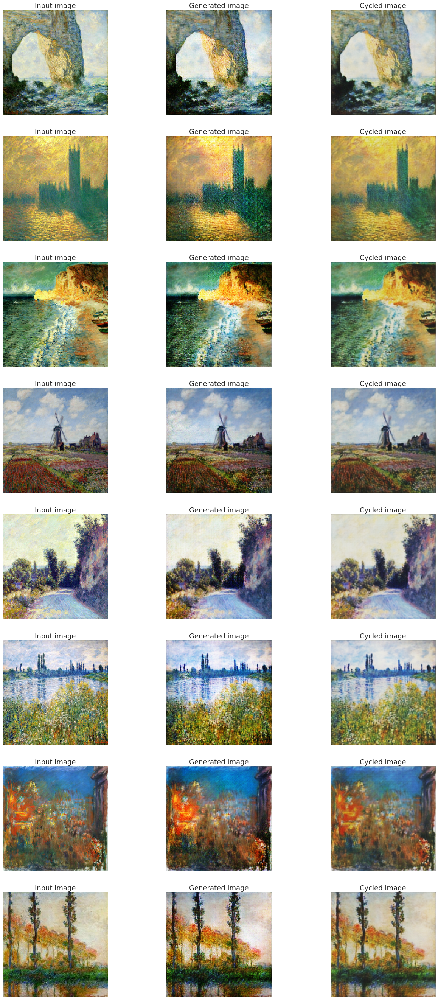

In [31]:
evaluate_cycle(monet_ds_eval.take(8), photo_generator, monet_generator, n_samples=8)

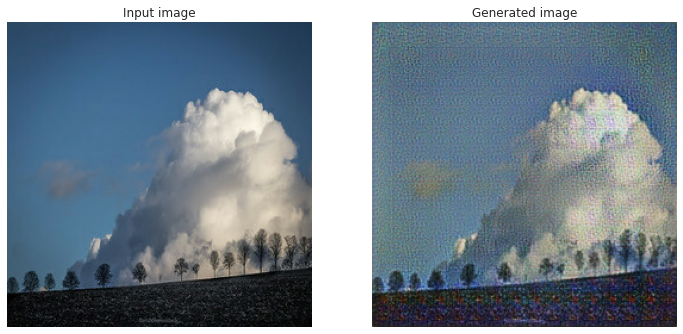

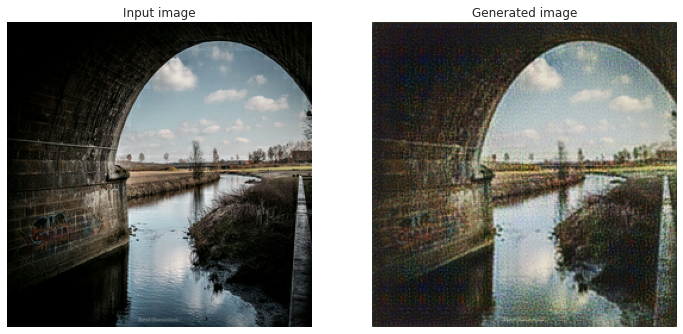

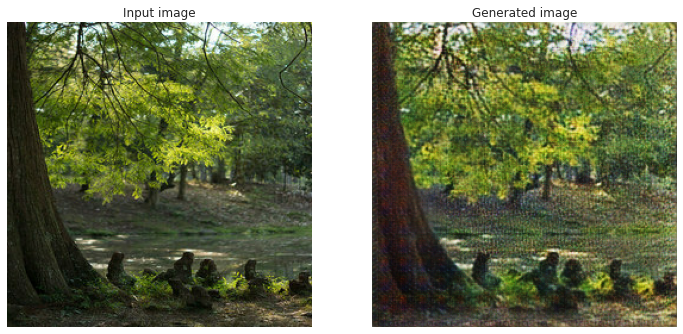

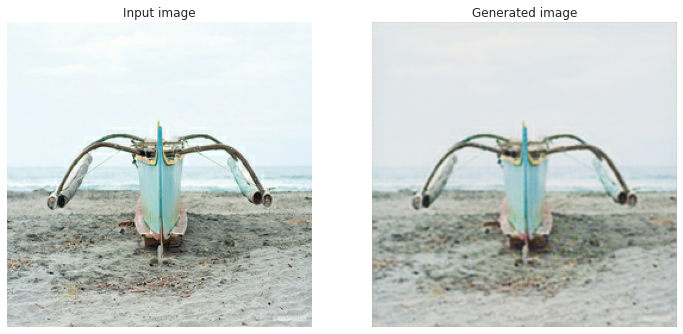

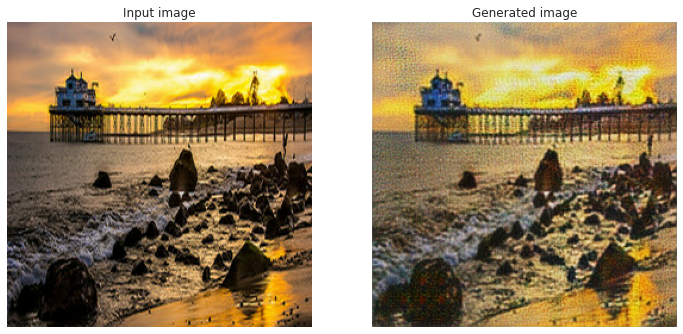

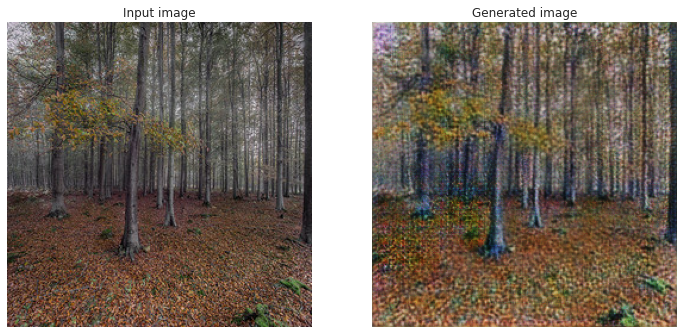

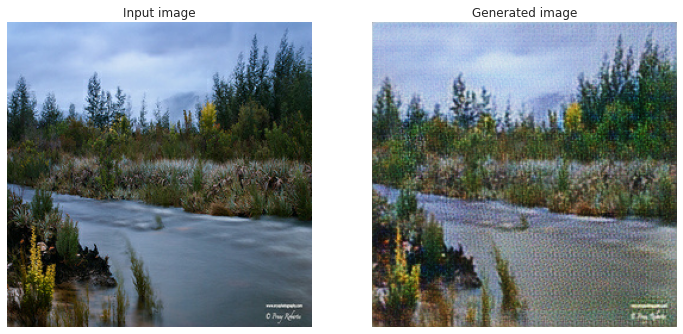

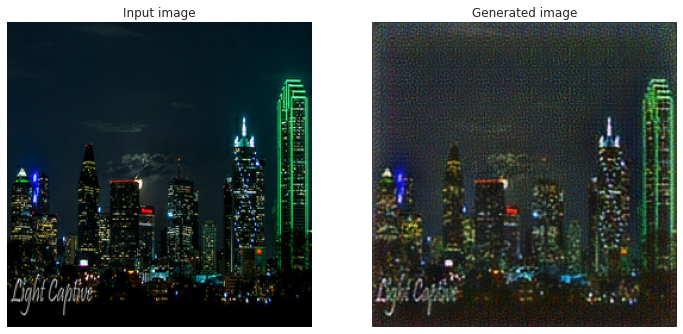

In [32]:
display_generated_samples(photo_ds_eval.take(8), monet_generator, 8)

In [51]:
monet_gen_loss = []
photo_gen_loss = []
monet_disc_loss = []
photo_disc_loss = []
for loss_i in history['monet_gen_loss']:
    monet_gen_loss.append(loss_i[-1][-1][-1])
for loss_i in history['photo_gen_loss']:
    photo_gen_loss.append(loss_i[-1][-1][-1])
for loss_i in history['monet_disc_loss']:
    monet_disc_loss.append(loss_i[-1][-1][-1])
for loss_i in history['photo_disc_loss']:
    photo_disc_loss.append(loss_i[-1][-1][-1])

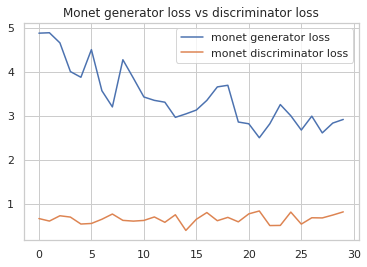

In [54]:
plt.plot(monet_gen_loss, label='monet generator loss')
plt.plot(monet_disc_loss, label='monet discriminator loss')
plt.title('Monet generator loss vs discriminator loss')
plt.legend()
plt.show()

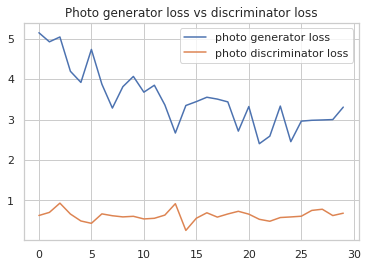

In [55]:
plt.plot(photo_gen_loss, label='photo generator loss')
plt.plot(photo_disc_loss, label='photo discriminator loss')
plt.title('Photo generator loss vs discriminator loss')
plt.legend()
plt.show()